In [1]:
%matplotlib inline

import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import calendar

from datetime import datetime
from datetime import timezone

from math import cos, radians
import matplotlib.patches as mpatches

import warnings
warnings.filterwarnings('ignore')

# Data uploading

In [20]:
YEARS = ["2019"]
#MONTHS = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']
#MONTHS = ['10']
MONTHS = ['02']
WEEKS = [1,2,3,4,5]

DATA_DIR = os.path.join("..", "..")
DATA_DIR = os.path.join(DATA_DIR, "..")
DATA_DIR = os.path.join(DATA_DIR, "Opensky")
DATA_DIR = os.path.join(DATA_DIR, "Data")
DATA_DIR = os.path.join(DATA_DIR, "ESSA")
DATA_DIR = os.path.join(DATA_DIR, "TMA")
DATA_DIR = os.path.join(DATA_DIR, "2019")
DATA_DIR = os.path.join(DATA_DIR, "osn_ESSA_states_TMA_2019")

df = pd.DataFrame()

for year in YEARS:
        
    for month in MONTHS:
    
        for week in WEEKS:
        
            if week == 5 and month == '02' and not calendar.isleap(int(year)):
                    continue
                    
            filename = "osn_arrival_ESSA_states_TMA_" + year + "_" + month + "_week" + str(week) + ".csv"
            
            full_filename = os.path.join(DATA_DIR, filename)
                
            week_df = pd.read_csv(full_filename, sep=' ', names = ['flightId', 'sequence', 'timestamp', \
                      'lat', 'lon', 'rawAltitude', 'altitude', 'velocity', 'beginDate', 'endDate'])
            
            df = df.append(week_df)

df.set_index(['flightId', 'sequence'], inplace = True)

In [29]:
PIs_DIR = os.path.join("..", "..")
PIs_DIR = os.path.join(PIs_DIR, "Data")
PIs_DIR = os.path.join(PIs_DIR, "PIs")
PIs_DIR = os.path.join(PIs_DIR, "ESSA")
PIs_DIR = os.path.join(PIs_DIR, "2019")
#filename = "PIs_vertical_by_flight_2019_10_week1.csv"
filename = "PIs_vertical_by_flight_2019_02_week1.csv"
full_filename = os.path.join(PIs_DIR, filename)
PIs_df = pd.read_csv(full_filename, sep=' ')
PIs_df.set_index(['flightId'], inplace = True)
#print(PIs_df.head())

In [4]:
number_of_flights = len(df.groupby(level='flightId'))
print(number_of_flights)

7702


In [5]:
def plot_TMA():
    
    fig, ax = plt.subplots(1, 1,figsize=(10,10))
    
    TMA_lon=[18.2130555555556, 18.5547222222222, 18.8469444444444, 19.3136111111111, 19.8280555555556, 19.2736111111111,
          18.9683333333333, 18.7547222222222, 18.5394444444444, 18.4572222222222, 17.9327777777778, 17.4569444444444,
          17.4077777777778, 17.2233333333333, 16.7077777777778, 16.2677777777778, 16.3183333333333, 16.4466666666667,
          17.5966666666667, 18.2130555555556];

    TMA_lat=[60.2994444444444, 60.2661111111111, 59.8827777777778, 60.0352777777778, 59.6736111111111, 59.5994444444444,
          59.255, 59.0419444444444, 58.8325, 58.7525, 58.5830555555556, 58.6163888888889, 58.9661111111111,
          58.9786111111111, 59.0119444444444, 59.0494444444444, 59.3238888888889, 59.7494444444444, 60.2327777777778,
          60.2994444444444];

    number_of_rwys = 4

    rwy1_lon=[17.9361345, 17.9791531944444];
    rwy1_lat=[59.6584189166667, 59.6638971944444 ];

    rwy2_lon=[17.9132249722222, 17.9237679722222];
    rwy2_lat=[59.637256, 59.6664016944444 ];

    rwy3_lon=[17.9507426111111, 17.9587480555556];
    rwy3_lat=[59.6263963888889, 59.6484673055556];

    central_latitude = min(TMA_lat) + (max(TMA_lat)-min(TMA_lat))/2
        
    # calculate the aspect ratio that will approximate a 
    # Mercator projection at this central latitude 
    mercator_aspect_ratio = 1/cos(radians(central_latitude))

    # set the aspect ratio of the axes to that
    ax.set_aspect(mercator_aspect_ratio)
 
    plt.xlabel('Longitude', fontsize=25)
    plt.ylabel('Latitude', fontsize=25)  
    
    plt.tick_params(labelsize=15)

    
    plt.plot(TMA_lon, TMA_lat, color="blue")
    plt.plot(rwy1_lon,rwy1_lat, color="red")
    plt.plot(rwy2_lon,rwy2_lat, color="red")
    plt.plot(rwy3_lon,rwy3_lat, color="red")
    
    ELTOK_lon = 16.6503
    ELTOK_lat = 59.5861
    HMR_lon = 18.3917
    HMR_lat = 60.2794
    XILAN_lon = 19.0761
    XILAN_lat = 59.6594
    NILUG_lon = 17.8847
    NILUG_lat = 58.8158

    plt.plot(HMR_lon, HMR_lat, 'ro')
    plt.plot(NILUG_lon, NILUG_lat, 'ro')
    plt.plot(XILAN_lon, XILAN_lat, 'ro')
    plt.plot(ELTOK_lon, ELTOK_lat, 'ro')

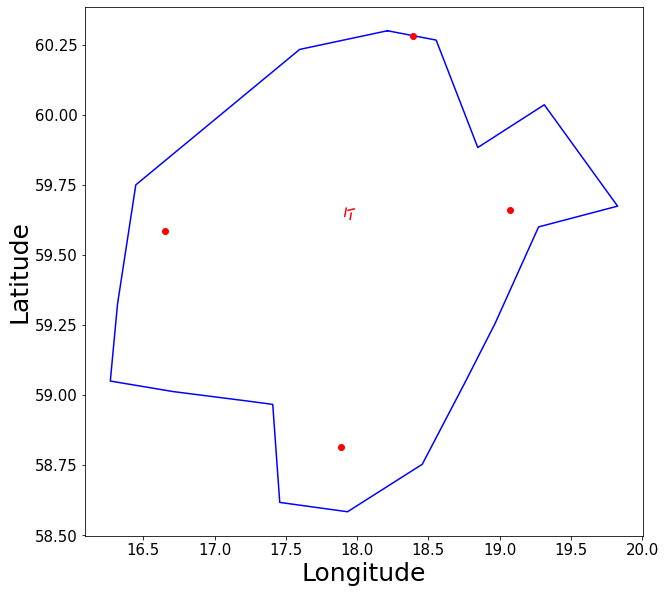

In [6]:
plot_TMA()

In [12]:
def plot_horizontal_profile(df, title = ""):
    linewidth = 1
    #fig, ax = plt.subplots(1, 1,figsize=(10,10))
    
    # calculate the aspect ratio that will approximate a 
    # Mercator projection at this central latitude 
    #mercator_aspect_ratio = 1/cos(radians(central_lat))

    # set the aspect ratio of the axes to that
    #ax.set_aspect(mercator_aspect_ratio)

    #plt.xlabel('Longitude', fontsize=25)
    #plt.ylabel('Latitude', fontsize=25)  
    
    #plt.tick_params(labelsize=15)
    
    plot_TMA()
    plt.title(title)
    
    if df.empty:
        return
    
    for flight_id, new_df in df.groupby(level='flightId'):
        #print(flight_id)
        flight_states_df = df.loc[(flight_id,), :]
        lon = []
        lat = []
        
        #print(flight_states_df.tail())
        for seq, row in flight_states_df.groupby(level='sequence'):
        
            lon.append(row['lon'].item())
            lat.append(row['lat'].item())
        
        plt.plot(lon, lat, color='k', linewidth=linewidth)

282


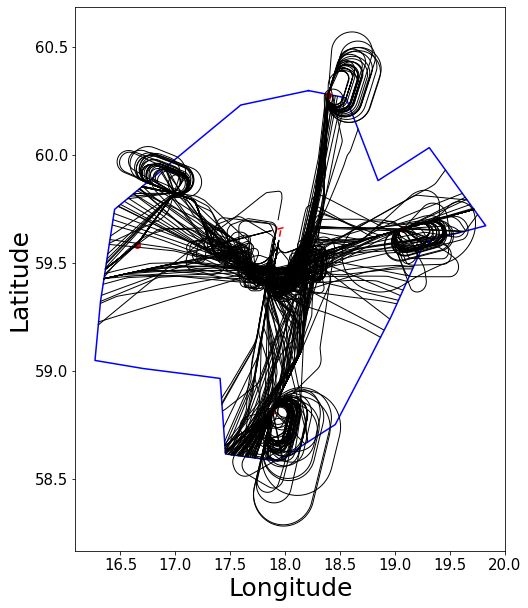

In [21]:
day_df = df[df['endDate']==190201]
print(len(day_df.groupby(level='flightId')))
plot_horizontal_profile(day_df)

282


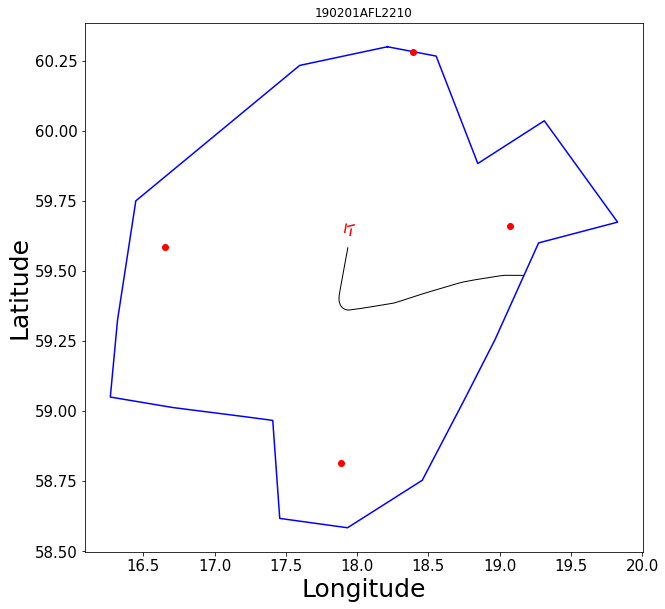

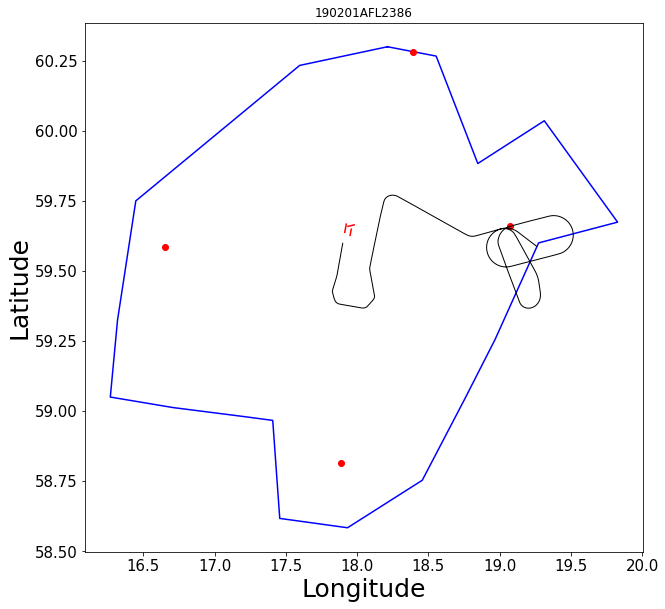

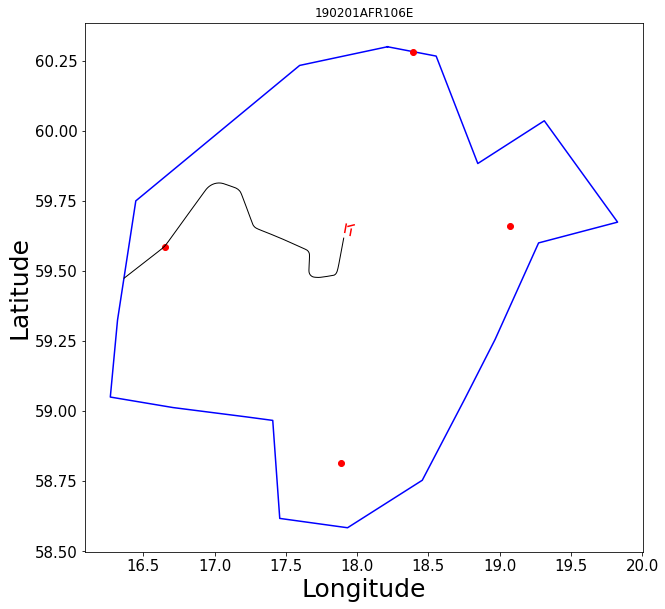

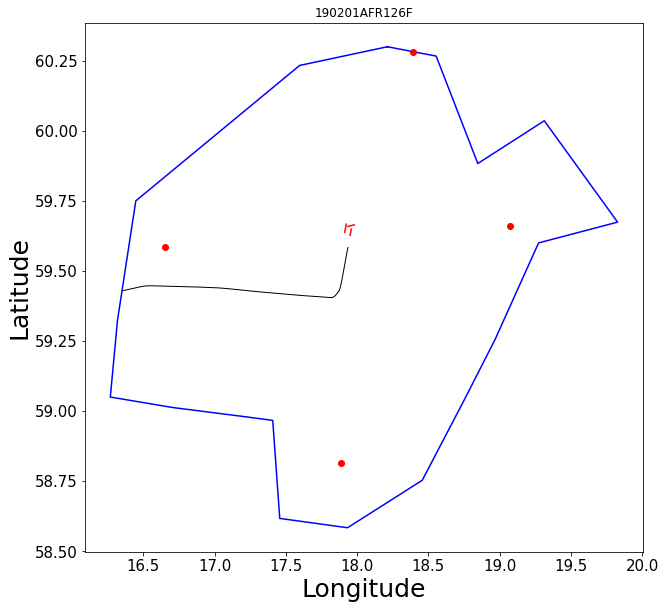

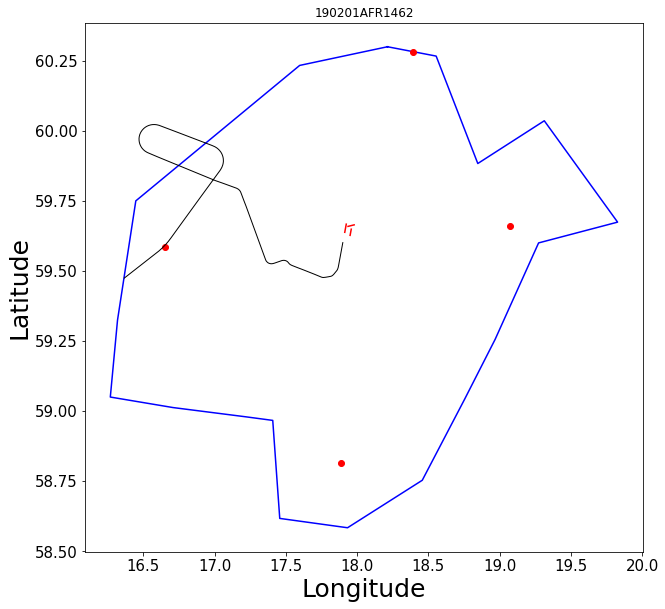

...

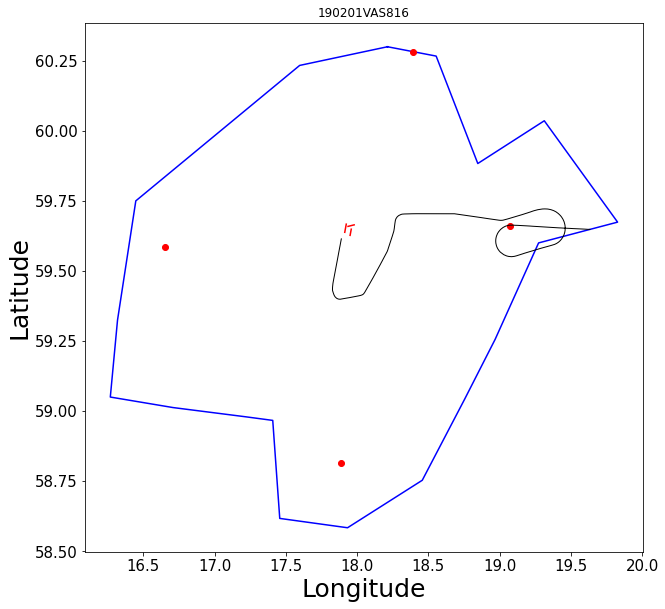

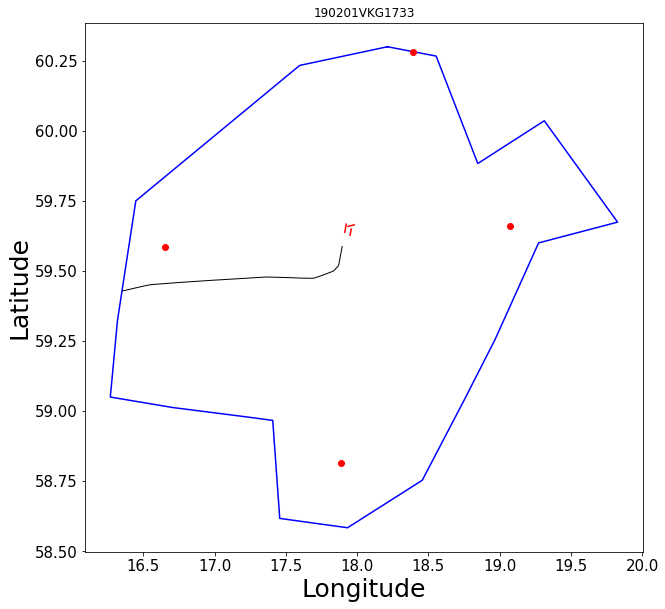

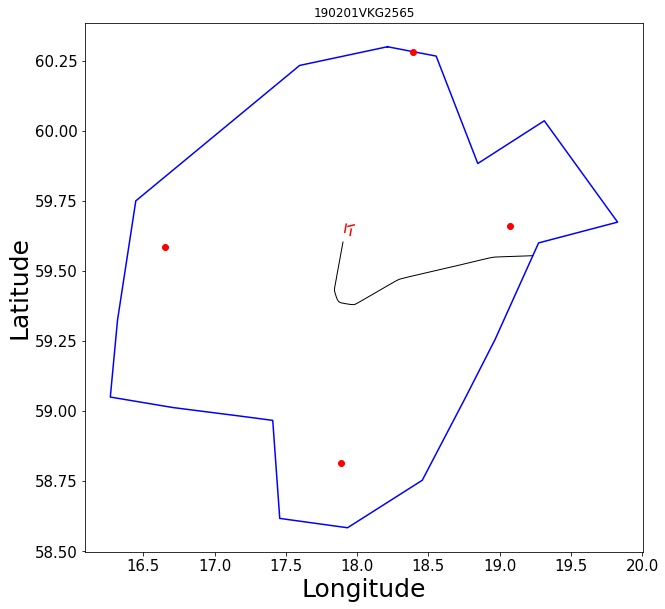

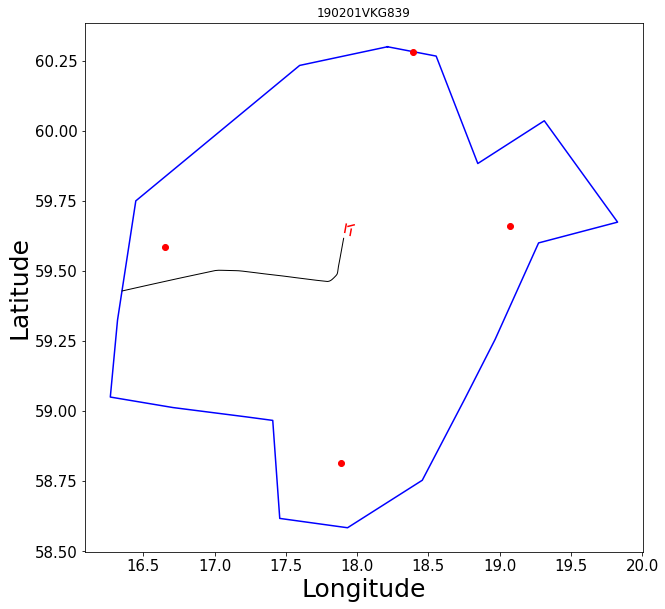

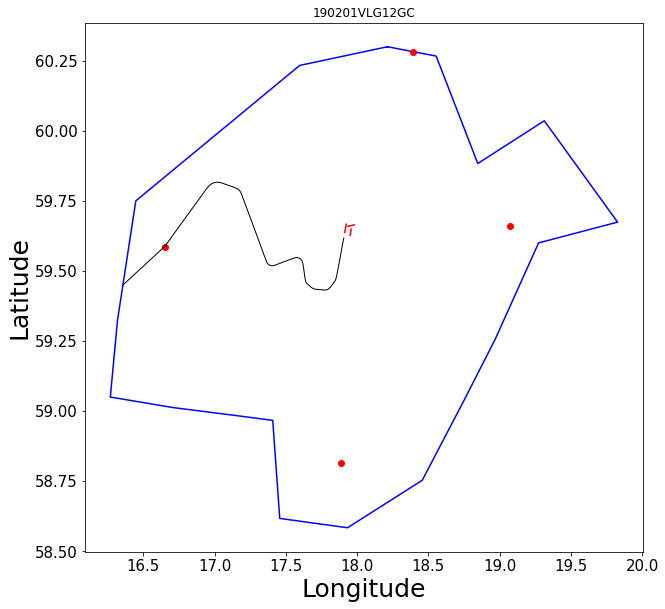

In [22]:
# 191001
# SAS1745 (trombone), 
# NAX14V, NAX2YW, NAX804, SAS043, 
# NAX4010, NAX4122, SAS019, SAS2550, SAS864, TVS4436, 
#day_df = df[df['endDate']==191001]

# 190201
# AFL2386, AFR1462, AUI173, BAW782F, BAW786F, DLH1FT, EWG9FK, EZS54KA, EZY25JV, EZY42KB, FIN1EB, FIN5LA, 
# IBE33MT, IBK231, IBK4MF, IBK6ED, IBK8WB, KLM17C, NAX16Z, NAX2PC, NAX4008, NAX4064, NAX4288, NAX4360, NAX44L,
# NAX4MB, NAX7206, NAX84G, NVR144, PGT9AB, SAS009, SAS019, SAS061, SAS071, SAS080, SAS082, SAS110, SAS1128,
# SAS1140, SAS1484, SAS158, SAS1590, SAS1749, SAS178, SAS2027, SAS2542, SAS2636, SAS2727, SAS38M, SAS410,
# SAS45B, SAS528, SAS56Y, SAS62F, SAS638, SAS723, SAS739, SAS868, SAS94L, SWR187F, TAP784, UAE155, VAS816
day_df = df[df['endDate']==190201]
print(len(day_df.groupby(level='flightId')))
for flight_id, new_df in day_df.groupby(level='flightId'):
    flight_df = day_df[day_df.index.get_level_values('flightId') == flight_id]
    plot_horizontal_profile(flight_df, flight_id)

In [55]:
#PIs_df = PIs_df[PIs_df['endDate']==191001]
ids_lst1 = ["101001SAS1745"]
ids_lst2 = ["101001NAX14V", "101001NAX2YW", "101001NAX804", "101001SAS043"]
ids_lst3 = ["101001NAX4010", "101001NAX4122", "101001SAS019", "101001SAS2550", "101001SAS864", "101001TVS4436"] 
ids_lst = ids_lst1 + ids_lst2 + ids_lst3

# 190201
PIs_df = PIs_df[PIs_df['endDate']==190201]
#print(PIs_df.head())
ids_lst = ["AFL2386", "AFR1462", "AUI173", "BAW782F", "BAW786F", "DLH1FT", "EWG9FK", "EZS54KA", "EZY25JV", "EZY42KB",
           "FIN1EB", "FIN5LA", "IBE33MT", "IBK231", "IBK6ED", "IBK8WB", "KLM17C", "NAX16Z", "NAX2PC", "NAX4008",
           "NAX4064", "NAX4288", "NAX4360", "NAX44L", "NAX4MB", "NAX7206", "NAX84G", "NVR144", "PGT9AB", "SAS009", "SAS019",
           "SAS061", "SAS071", "SAS080", "SAS082", "SAS110", "SAS1128", "SAS1140", "SAS1484", "SAS158", "SAS1590", "SAS1749",
           "SAS178", "SAS2027", "SAS2542", "SAS2636", "SAS2727", "SAS38M", "SAS410", "SAS45B", "SAS528", "SAS56Y", "SAS62F",
           "SAS638", "SAS723", "SAS739", "SAS868", "SAS94L", "SWR187F", "TAP784", "UAE155", "VAS816"]

PIs_without_hold_df = PIs_df.copy()
PIs_with_hold_df = pd.DataFrame()

for flight_id in ids_lst:
    id = "190201" + flight_id
    PIs_without_hold_df = PIs_without_hold_df.drop(id)
    
    flight_df = PIs_df[PIs_df.index.get_level_values('flightId') == id]
    PIs_with_hold_df = PIs_with_hold_df.append(flight_df)
   
max_level_without_hold = max(PIs_without_hold_df['maxTimeOnLevel'].to_list())
min_level_with_hold = min(PIs_with_hold_df['maxTimeOnLevel'].to_list())

print(max_level_without_hold)
print(min_level_with_hold)

temp_df = PIs_without_hold_df[PIs_without_hold_df['maxTimeOnLevel']==max_level_without_hold]
#print(temp_df) # 190201EZY27TB

temp_df = PIs_with_hold_df[PIs_with_hold_df['maxTimeOnLevel']==min_level_with_hold]
#print(temp_df) # 190201BAW786F

max_time_on_levels_without_hold = max(PIs_without_hold_df['timeOnLevelsPercent'].to_list())
min_time_on_levels_with_hold = min(PIs_with_hold_df['timeOnLevelsPercent'].to_list())
print(max_time_on_levels_without_hold)
print(min_time_on_levels_with_hold)

temp_df = PIs_without_hold_df[PIs_without_hold_df['timeOnLevelsPercent']==max_time_on_levels_without_hold]
#print(temp_df) # 190201EJM127

temp_df = PIs_with_hold_df[PIs_with_hold_df['timeOnLevelsPercent']==min_time_on_levels_with_hold]
#print(temp_df) # 190201BAW786F

372
44
44.3
2.8
               beginDate  endDate  beginHour  endHour  numberOfLevels  \
flightId                                                                
190201BAW786F     190201   190201         22       23               1   

               timeOnLevels  timeOnLevelsPercent  maxTimeOnLevel    timeTMA  \
flightId                                                                      
190201BAW786F         0.733                  2.8              44  25.816667   

               cdoAltitude  
flightId                    
190201BAW786F       2088.0  


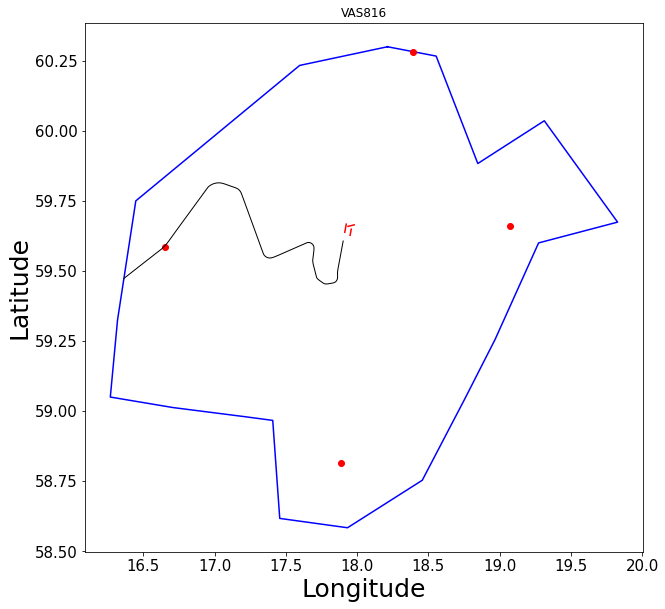

In [56]:
flight_df = day_df[day_df.index.get_level_values('flightId') == "190201EJM127"]
plot_horizontal_profile(flight_df, flight_id)

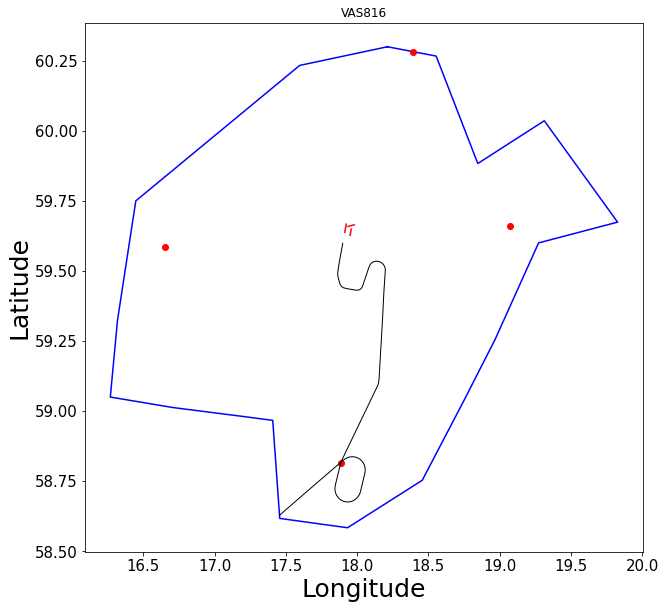

In [59]:
flight_df = day_df[day_df.index.get_level_values('flightId') == "190201BAW786F"]
plot_horizontal_profile(flight_df, flight_id)

In [48]:
def plot_vertical_profile(flight_df, final_approach, linewidth):
    
    df = flight_df[flight_df['altitude']>=final_approach]
       
    for flight_id, flight_id_group in df.groupby(level='flightId'):
        flight_states_df = df.loc[(flight_id,), :]
        
        flight_states_df =flight_states_df.sort_index(level=['sequence'], ascending = False)
        
        if not flight_states_df.empty:

            opensky_states_altitudes = flight_id_group['altitude'].tolist()
            opensky_states_times = flight_id_group.index.get_level_values('sequence').tolist()

            prev_altitude = final_approach
                
            plt.plot(opensky_states_times, opensky_states_altitudes, color='k', linewidth=linewidth)

In [51]:
def plot_raw_vertical_profile(flight_df, final_approach, linewidth):
    
    df = flight_df[flight_df['altitude']>=final_approach]
       
    for flight_id, flight_id_group in df.groupby(level='flightId'):
        flight_states_df = df.loc[(flight_id,), :]
        
        flight_states_df =flight_states_df.sort_index(level=['sequence'], ascending = False)
        
        if not flight_states_df.empty:

            opensky_states_altitudes = flight_id_group['rawAltitude'].tolist()
            opensky_states_times = flight_id_group.index.get_level_values('sequence').tolist()

            prev_altitude = final_approach
                
            plt.plot(opensky_states_times, opensky_states_altitudes, color='k', linewidth=linewidth)

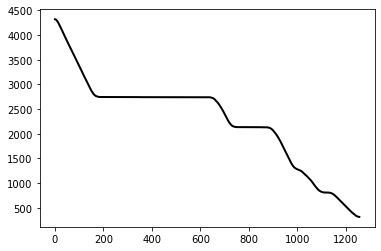

In [57]:
flight_df = day_df[day_df.index.get_level_values('flightId') == "190201EJM127"]
plot_vertical_profile(flight_df, 100, 2)

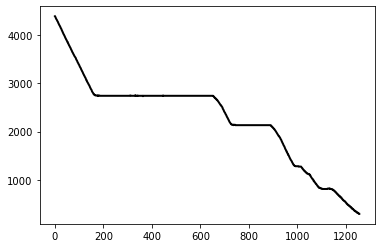

In [58]:
flight_df = day_df[day_df.index.get_level_values('flightId') == "190201EJM127"]
plot_raw_vertical_profile(flight_df, 100, 2)